 #  Airfoil Self-Noise Data Set 
 
 Salem Ameen, PhD student at Salford University

# Load the data

In [27]:
# import python packages
import pandas as pd
import pandas
#import statsmodels.formula.api as sm
from sklearn import metrics
from sklearn.cross_validation import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import numpy
# allow plots to appear directly in the notebook
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
# fix random seed for reproducibility
plt.rcParams['figure.figsize'] = (15, 6)
%matplotlib inline

 Down load data from the site
 There are multiple spaces used as a delimiter, that's why it's not working when you use a single space as a delimiter (sep=' ')



url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/housing/housing.data'

data = pandas.read_csv(url, sep=',', header = None)

In [28]:
url = 'http://archive.ics.uci.edu/ml/machine-learning-databases/00291/airfoil_self_noise.dat'
names = ['Frequency', 'Angle', 'Chord', 'Free_stream', 'Suction', 'pressure']
feature_names = names
data = pd.read_csv(url, sep='\s+', names = names)

In [29]:
data.shape

(1503, 6)

In [30]:
data.head(2)

,Frequency,Angle,Chord,Free_stream,Suction,pressure
0,800,0.0,0.305,71.3,0.003,126.201
1,1000,0.0,0.305,71.3,0.003,125.201


In [31]:
dataset = data
df = data

In [32]:
data.head(3)

,Frequency,Angle,Chord,Free_stream,Suction,pressure
0,800,0.0,0.305,71.3,0.003,126.201
1,1000,0.0,0.305,71.3,0.003,125.201
2,1250,0.0,0.305,71.3,0.003,125.951


In [33]:
df.describe()

,Frequency,Angle,Chord,Free_stream,Suction,pressure
count,1503.000,1503.000,1503.000,1503.000,1.503e+03,1503.000
mean,2886.381,6.782,0.137,50.861,1.114e-02,124.836
std,3152.573,5.918,0.094,15.573,1.315e-02,6.899
min,200.000,0.000,0.025,31.700,4.007e-04,103.380
25%,800.000,2.000,0.051,39.600,2.535e-03,120.191
50%,1600.000,5.400,0.102,39.600,4.957e-03,125.721
75%,4000.000,9.900,0.229,71.300,1.558e-02,129.995
max,20000.000,22.200,0.305,71.300,5.841e-02,140.987


In [34]:
pd.isnull(df).any()

Frequency      False
Angle          False
Chord          False
Free_stream    False
Suction        False
pressure       False
dtype: bool

In [35]:
pd.isnull(df).sum()

Frequency      0
Angle          0
Chord          0
Free_stream    0
Suction        0
pressure       0
dtype: int64

In [36]:
shape = data.shape
print(shape)

(1503, 6)


In [37]:
types = data.dtypes
print(types)

Frequency        int64
Angle          float64
Chord          float64
Free_stream    float64
Suction        float64
pressure       float64
dtype: object


In [38]:
data.tail()

,Frequency,Angle,Chord,Free_stream,Suction,pressure
1498,2500,15.6,0.102,39.6,0.053,110.264
1499,3150,15.6,0.102,39.6,0.053,109.254
1500,4000,15.6,0.102,39.6,0.053,106.604
1501,5000,15.6,0.102,39.6,0.053,106.224
1502,6300,15.6,0.102,39.6,0.053,104.204


In [39]:
pandas.set_option('display.width', 100)
pandas.set_option('precision', 3)
description = data.describe()
print(description)

       Frequency     Angle     Chord  Free_stream    Suction  pressure
count   1503.000  1503.000  1503.000     1503.000  1.503e+03  1503.000
mean    2886.381     6.782     0.137       50.861  1.114e-02   124.836
std     3152.573     5.918     0.094       15.573  1.315e-02     6.899
min      200.000     0.000     0.025       31.700  4.007e-04   103.380
25%      800.000     2.000     0.051       39.600  2.535e-03   120.191
50%     1600.000     5.400     0.102       39.600  4.957e-03   125.721
75%     4000.000     9.900     0.229       71.300  1.558e-02   129.995
max    20000.000    22.200     0.305       71.300  5.841e-02   140.987


In [40]:
data.describe()

,Frequency,Angle,Chord,Free_stream,Suction,pressure
count,1503.000,1503.000,1503.000,1503.000,1.503e+03,1503.000
mean,2886.381,6.782,0.137,50.861,1.114e-02,124.836
std,3152.573,5.918,0.094,15.573,1.315e-02,6.899
min,200.000,0.000,0.025,31.700,4.007e-04,103.380
25%,800.000,2.000,0.051,39.600,2.535e-03,120.191
50%,1600.000,5.400,0.102,39.600,4.957e-03,125.721
75%,4000.000,9.900,0.229,71.300,1.558e-02,129.995
max,20000.000,22.200,0.305,71.300,5.841e-02,140.987


## Summary and recommendation so far of the data

A quick summary of the data from previous operations

1. The data has outlier and it's clear by looking to the max and 75% for example on CRIM and ZN atributes. In contrast of that B attribute has the outlier on the smallest value which is clear from the minimum value.
2. Some data is sparse like ZN and CHAS atributes.
3. The data has missing values.

Recommendation so far
1. Use preprocessing method that take into account sparsity and outliers, even though the best way try many method on validation.


In [41]:
class_counts = data.groupby('pressure').size()
print(class_counts)

pressure
103.380    1
104.130    1
104.204    1
104.500    1
106.111    1
106.224    1
106.260    1
106.582    1
106.604    1
106.880    1
107.147    1
107.267    1
107.284    1
107.405    1
107.985    1
108.034    2
108.185    1
108.265    1
108.407    1
108.625    1
108.649    1
108.684    1
108.689    1
108.721    1
108.991    1
109.222    1
109.254    1
109.520    1
109.619    1
109.638    1
          ..
136.798    1
136.826    1
136.837    1
136.883    1
136.886    1
136.941    1
137.007    1
137.026    1
137.047    1
137.068    1
137.076    1
137.207    1
137.233    1
137.658    1
137.813    1
138.123    1
138.274    1
138.423    1
138.523    1
138.537    1
138.557    1
138.607    1
138.758    1
139.226    1
139.428    1
139.438    1
139.808    1
139.918    1
140.158    1
140.987    1
dtype: int64


In [42]:
skew = data.skew()
print(skew)

Frequency      2.137
Angle          0.689
Chord          0.457
Free_stream    0.236
Suction        1.702
pressure      -0.419
dtype: float64


CRIM, CHAS and ZN have positive skwed which may be of the outlier on the data (highest value)

B has big negative skwed becuase of the the smallest value

## Corelation of the data
More Information in the following Link
http://www.statisticssolutions.com/correlation-pearson-kendall-spearman/

In [43]:
correlations = data.corr(method='pearson')
print(correlations)

             Frequency  Angle  Chord  Free_stream  Suction  pressure
Frequency        1.000 -0.273 -0.004        0.134   -0.230    -0.391
Angle           -0.273  1.000 -0.505        0.059    0.753    -0.156
Chord           -0.004 -0.505  1.000        0.004   -0.221    -0.236
Free_stream      0.134  0.059  0.004        1.000   -0.004     0.125
Suction         -0.230  0.753 -0.221       -0.004    1.000    -0.313
pressure        -0.391 -0.156 -0.236        0.125   -0.313     1.000


In [44]:
df.corr(method='pearson')

,Frequency,Angle,Chord,Free_stream,Suction,pressure
Frequency,1.000,-0.273,-0.004,0.134,-0.230,-0.391
Angle,-0.273,1.000,-0.505,0.059,0.753,-0.156
Chord,-0.004,-0.505,1.000,0.004,-0.221,-0.236
Free_stream,0.134,0.059,0.004,1.000,-0.004,0.125
Suction,-0.230,0.753,-0.221,-0.004,1.000,-0.313
pressure,-0.391,-0.156,-0.236,0.125,-0.313,1.000


In [45]:
pearson = df.corr(method='pearson')
# assume pressure attr is the last, then remove corr with itself
corr_with_pressure = pearson.ix[-1][:-1]
# attributes sorted from the most predictive
predictivity = corr_with_pressure.sort(ascending=False)

/home/salm/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:5: FutureWarning: sort is deprecated, use sort_values(inplace=True) for INPLACE sorting


In [46]:
# correlation to the pressure or how much inflonce the taget 
corr_with_pressure[abs(corr_with_pressure).argsort()[::-1]]

Frequency     -0.391
Suction       -0.313
Chord         -0.236
Angle         -0.156
Free_stream    0.125
Name: pressure, dtype: float64

In [47]:
attrs = pearson.iloc[:-1,:-1] # all except pressure
# only important correlations and not auto-correlations
threshold = 0.5
# {('LSTAT', 'TAX'): 0.543993, ('INDUS', 'RAD'): 0.595129, ...
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()
#     attribute pair  correlation
# 0     (AGE, INDUS)     0.644779
# 1     (INDUS, RAD)     0.595129
# ...
unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), columns=['attribute pair', 'correlation'])
# sorted by absolute value
unique_important_corrs = unique_important_corrs.ix[
    abs(unique_important_corrs['correlation']).argsort()[::-1]]

In [48]:
unique_important_corrs

,attribute pair,correlation
0,"(Angle, Suction)",0.753
1,"(Angle, Chord)",-0.505


In [49]:
%timeit df.corr(method='pearson')

1000 loops, best of 3: 383 µs per loop


In [50]:
df.corr(method='spearman')

,Frequency,Angle,Chord,Free_stream,Suction,pressure
Frequency,1.000,-0.293,-0.012,0.103,-0.351,-0.341
Angle,-0.293,1.000,-0.466,0.065,0.881,-0.141
Chord,-0.012,-0.466,1.000,0.007,-0.075,-0.243
Free_stream,0.103,0.065,0.007,1.000,-0.006,0.116
Suction,-0.351,0.881,-0.075,-0.006,1.000,-0.280
pressure,-0.341,-0.141,-0.243,0.116,-0.280,1.000


In [51]:
pearson = df.corr(method='spearman')
# assume pressure attr is the last, then remove corr with itself
corr_with_pressure = pearson.ix[-1][:-1]
# attributes sorted from the most predictive
predictivity = corr_with_pressure.sort(ascending=False)

/home/salm/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:5: FutureWarning: sort is deprecated, use sort_values(inplace=True) for INPLACE sorting


In [52]:
corr_with_pressure[abs(corr_with_pressure).argsort()[::-1]]

Frequency     -0.341
Suction       -0.280
Chord         -0.243
Angle         -0.141
Free_stream    0.116
Name: pressure, dtype: float64

In [53]:
attrs = pearson.iloc[:-1,:-1] # all except pressure
# only important correlations and not auto-correlations
threshold = 0.5
# {('LSTAT', 'TAX'): 0.543993, ('INDUS', 'RAD'): 0.595129, ...
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()
#     attribute pair  correlation
# 0     (AGE, INDUS)     0.644779
# 1     (INDUS, RAD)     0.595129
# ...
unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), columns=['attribute pair', 'correlation'])
# sorted by absolute value
unique_important_corrs = unique_important_corrs.ix[
    abs(unique_important_corrs['correlation']).argsort()[::-1]]

In [54]:
# correlations between attribute pairs
unique_important_corrs

,attribute pair,correlation
0,"(Angle, Suction)",0.881


In [55]:
%timeit df.corr(method='spearman')

100 loops, best of 3: 2.69 ms per loop


In [56]:
df.corr(method='kendall')

,Frequency,Angle,Chord,Free_stream,Suction,pressure
Frequency,1.000,-0.210,-0.009,0.079,-0.246,-0.234
Angle,-0.210,1.000,-0.370,0.051,0.704,-0.093
Chord,-0.009,-0.370,1.000,0.006,-0.036,-0.174
Free_stream,0.079,0.051,0.006,1.000,-0.008,0.087
Suction,-0.246,0.704,-0.036,-0.008,1.000,-0.193
pressure,-0.234,-0.093,-0.174,0.087,-0.193,1.000


In [57]:
pearson = df.corr(method='kendall')
# assume pressure attr is the last, then remove corr with itself
corr_with_pressure = pearson.ix[-1][:-1]
# attributes sorted from the most predictive
predictivity = corr_with_pressure.sort(ascending=False)

/home/salm/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:5: FutureWarning: sort is deprecated, use sort_values(inplace=True) for INPLACE sorting


In [58]:
corr_with_pressure[abs(corr_with_pressure).argsort()[::-1]]

Frequency     -0.234
Suction       -0.193
Chord         -0.174
Angle         -0.093
Free_stream    0.087
Name: pressure, dtype: float64

In [59]:
attrs = pearson.iloc[:-1,:-1] # all except pressure
# only important correlations and not auto-correlations
threshold = 0.5
# {('LSTAT', 'TAX'): 0.543993, ('INDUS', 'RAD'): 0.595129, ...
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()
#     attribute pair  correlation
# 0     (AGE, INDUS)     0.644779
# 1     (INDUS, RAD)     0.595129
# ...
unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), columns=['attribute pair', 'correlation'])
# sorted by absolute value
unique_important_corrs = unique_important_corrs.ix[
    abs(unique_important_corrs['correlation']).argsort()[::-1]]

In [60]:
unique_important_corrs

,attribute pair,correlation
0,"(Angle, Suction)",0.704


In [61]:
%timeit df.corr(method='kendall')

1 loop, best of 3: 288 ms per loop


# Visulize the data

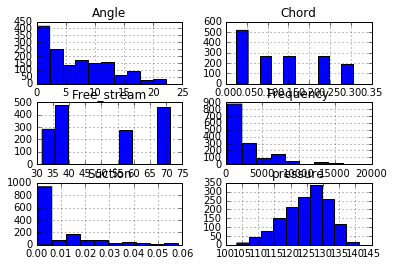

In [62]:
data.hist()
plt.rcParams['figure.figsize'] = (20, 15)
plt.show()

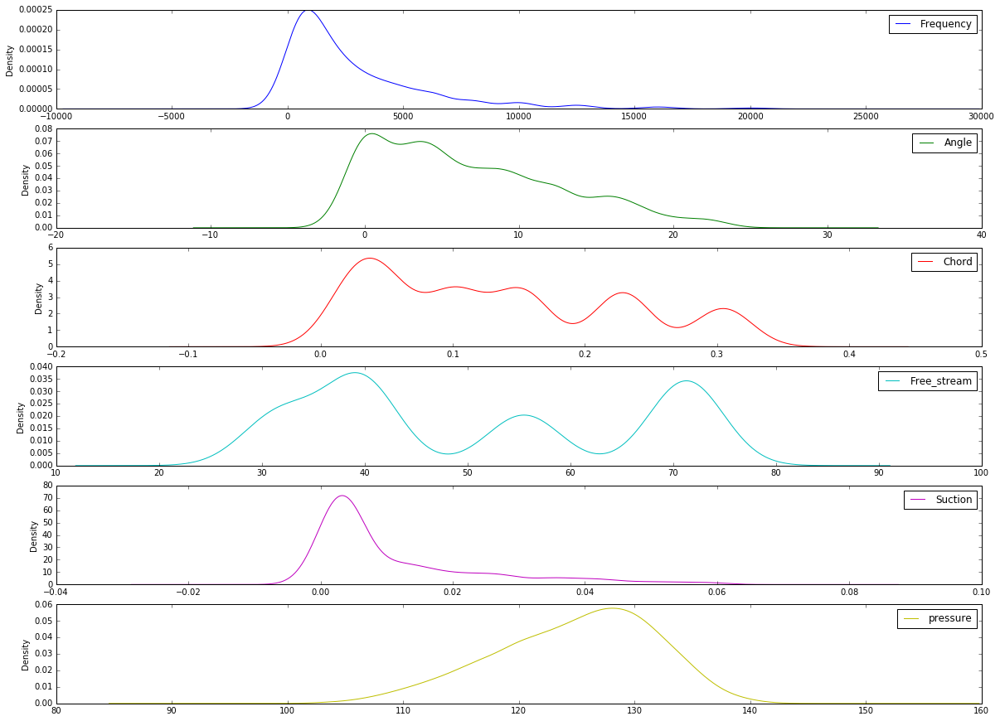

In [63]:
data.plot(kind='density', subplots=True,  sharex=False)
plt.show()

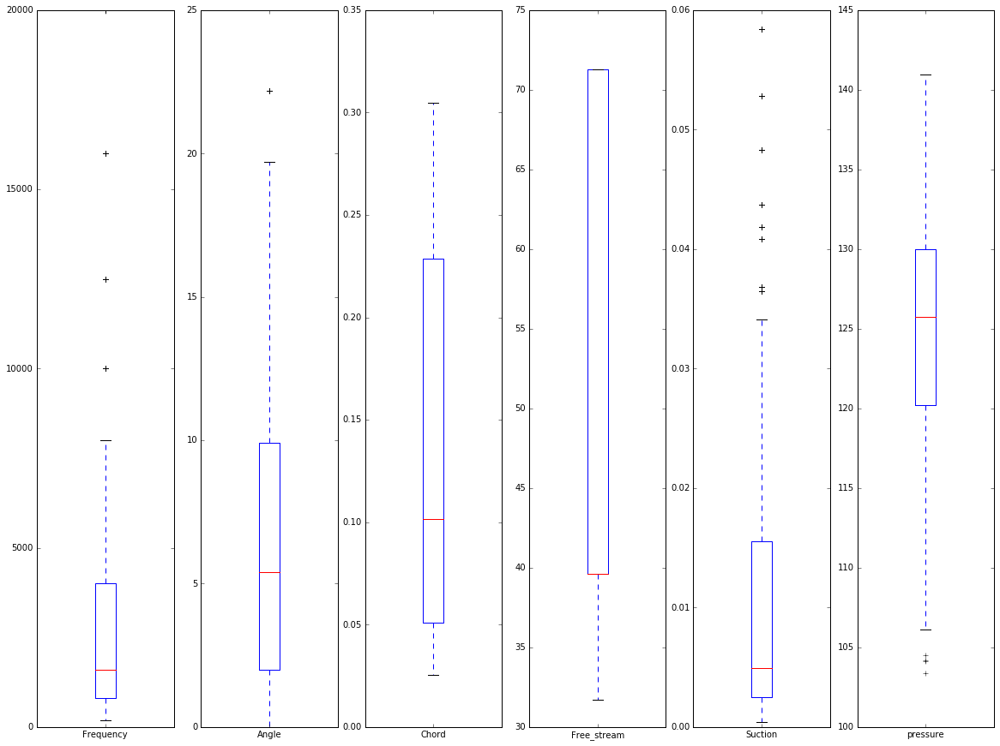

In [64]:
data.plot(kind='box', subplots=True,  sharex=False, sharey=False)
plt.show()

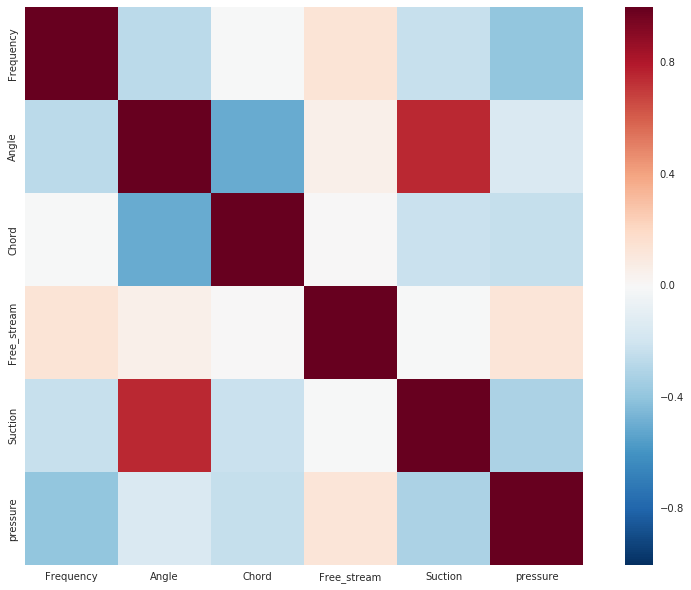

In [65]:
# Encode the categorical features as numbers
import seaborn as sns
def number_encode_features(df):
    result = df.copy()
    encoders = {}
    for column in result.columns:
        if result.dtypes[column] == np.object:
            encoders[column] = preprocessing.LabelEncoder()
            result[column] = encoders[column].fit_transform(result[column])
    return result, encoders

# Calculate the correlation and plot it
plt.rcParams['figure.figsize'] = (15, 10)
encoded_data, _ = number_encode_features(data)
sns.heatmap(encoded_data.corr(), square=True)
plt.show()

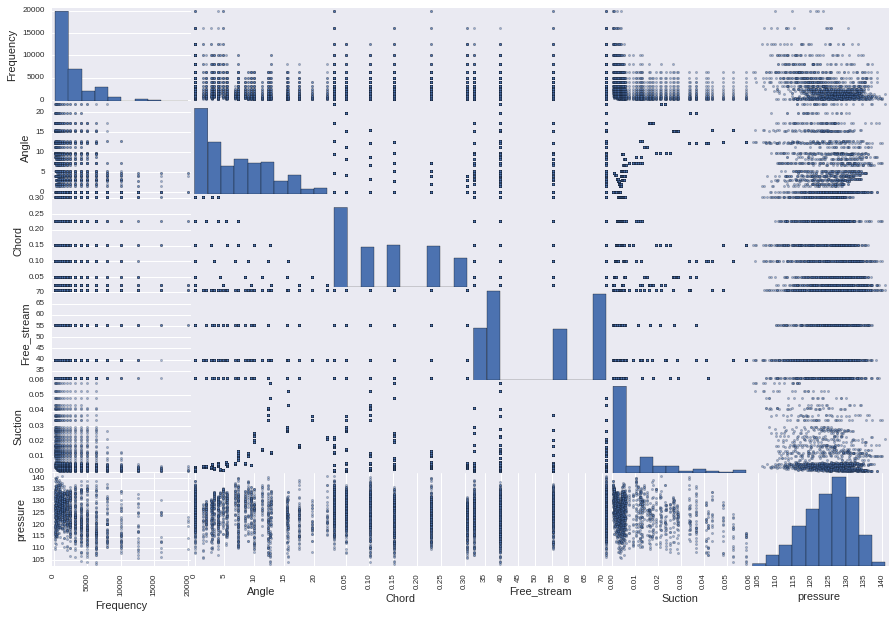

In [66]:
from pandas.tools.plotting import scatter_matrix
scatter_matrix(data)
plt.show()

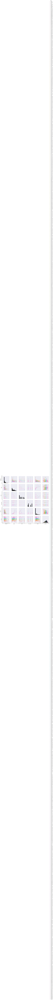

In [67]:
import seaborn as sns
sns.pairplot(data, hue='pressure')

In [68]:
sns.corrplot(df) # compute and plot the pair-wise correlations
# save to file, remove the big white borders
plt.savefig('attribute_correlations.png', tight_layout=True)

AttributeError: 'module' object has no attribute 'corrplot'

In [ ]:
# make a plot of specified dimension (in inches), just a 1x1 subplot
fig, ax = plt.subplots(figsize=(10, 10))
# pass the axis to draw on
sns.corrplot(df, ax=ax)

In [ ]:
# red-blue (hues 250 and 10, just 3 colors) diverging pallete with white center
sns.corrplot(df, cmap=sns.diverging_palette(250, 10, n=3, as_cmap=True))

In [ ]:
sns.corrplot(df, annot=False, sig_stars=False, diag_names=False)

In [ ]:
sns.corrplot(df,method='spearman') # compute and plot the pair-wise correlations
# save to file, remove the big white borders
plt.savefig('attribute_correlations_spearman.png', tight_layout=True)

In [ ]:
sns.corrplot(df,method='kendall') # compute and plot the pair-wise correlations
# save to file, remove the big white borders
plt.savefig('attribute_correlations_kendall.png', tight_layout=True)

### Attribute histograms

In [ ]:
import matplotlib.pyplot as plt
attr = df['pressure']
plt.hist(attr)

In [ ]:
plt.hist(attr, bins=50)

In [ ]:
#sns.displot(attr)

In [ ]:
#sns.countplot(attr)

# Prepare the data for classification

from sklearn import preprocessing
# for training data
dataset = data.values
X = dataset[:,0:13].astype(float)
Y = dataset[:,13]
features = preprocessing.scale(X)
pressure = Y

# Make developement dataset for genrilization and final testing
from sklearn.cross_validation import train_test_split
# Extracting 20% testing data
X_train, X_test, y_train, y_test = train_test_split(
    features, pressure, test_size=0.20, random_state=0)

print 'Number of training examples',len(X_train)
print 'Number of validation examples',len(X_test)

## Preproccing

from sklearn import preprocessing
# normalize the data attributes
#X_train = preprocessing.normalize(X_train)
#X_test = preprocessing.normalize(X_test)
# standardize the data attributes
X_train = preprocessing.scale(X_train)
X_test = preprocessing.scale(X_test)

np.save('./data/X_train', X_train)
np.save('./data/y_train', y_train)
np.save('./data/X_test', X_test)
np.save('./data/y_test', y_test)

# Final Conclusion

1. There is many outliter in the data
2. Some data is spasity
3. We can F regression to compute the the ranking of the features as once can remove or add new feature to the model as there is no scary from Anscombe's quartet. see https://en.wikipedia.org/wiki/Anscombe%27s_quartet
4. The good link to understand more is this q. http://stats.stackexchange.com/questions/204141/difference-between-selecting-features-based-on-f-regression-and-based-on-r2
